In [1]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.feature_selection import VarianceThreshold, SelectKBest
from sklearn.decomposition import PCA
from scipy.stats import zscore
import seaborn as sns


In [2]:
#LOADING THE DATASETS

In [3]:

pd.options.display.max_columns = 50
sns.set(style="darkgrid", rc={"axes.facecolor": "black"})
data1 = pd.read_csv('2018CrimeStatisticsByCategoryOfCrime.csv',encoding='latin-1')
data1=pd.DataFrame(data1)
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)
print(data1)


    Unnamed: 0                                    Unnamed: 1 REPORTED CASES  \
0          NaN                                           NaN            NaN   
1          NaN                                           NaN   Totals Cases   
2        S/No.                         CASE/CRIME INCIDENCES              1   
3          NaN                                     HOMICIDES            NaN   
4            1                          Death  (by shooting)            190   
5            2                         Death (by mob action)            636   
6            3                             Death (Poisoning)             81   
7            4          Death (Aggravated Domestic Violence)            362   
8            5                        Death(Fire Out Breaks)             42   
9            8             Other Death (Not Specified above)          3,186   
10         NaN                          Sub Total(Homicides)          4,497   
11         NaN                               ECONOMI

In [36]:
#DISPLAYING THE DATASET IN A TABULAR FORM
from tabulate import tabulate

# Convert DataFrame to a list of lists
data = data1.values.tolist()

# Get the column headers
headers = list(data1.columns)

# Display the dataset with visible columns and rows
table = tabulate(data, headers=headers, tablefmt="fancy_grid")
print(table)


╒══════════════╤══════════════════════════════════════════════╤══════════════════╤═════════════════════╤══════════════════╤══════════════════════╤═══════════════════════════╤════════════════════════╤═══════════════════════╤═════════════════╤════════════════════════╤══════════════════════════╤═══════════════╤═══════════════╤═══════════════╤═══════════════════╤═══════════════╤═══════════════╤═══════════════╤═══════════════╤═══════════════╤════════════════╤═══════════════════════════════╤═══════════════╤═══════════════╤═══════════════╤═══════════════╤═══════════════╤══════════════════════╤═══════════════╤═══════════════╤═════════════════════════╤══════════════════╤═══════════════╤═══════════════╤═══════════════╤════════════════════════╤════════════════╕
│ Unnamed: 0   │ Unnamed: 1                                   │ REPORTED CASES   │ Unnamed: 3          │ Unnamed: 4       │ Unnamed: 5           │ PERFOMANCE                │ Unnamed: 7             │ Unnamed: 8            │ Unnamed: 9     

In [4]:
# Check if the column named "Recovered" exists

if 'Recovered' in data1.columns:
    print("The 'Recovered' column exists in the dataset.")
else:
    print("The 'Recovered' column does not exist in the dataset.")

The 'Recovered' column does not exist in the dataset.


In [5]:
#checking wrong format of data
#first of all i checked for the datatypes of each colum
data1.dtypes

Unnamed: 0                     object
Unnamed: 1                     object
REPORTED CASES                 object
Unnamed: 3                     object
Unnamed: 4                     object
Unnamed: 5                     object
PERFOMANCE                     object
Unnamed: 7                     object
Unnamed: 8                     object
Unnamed: 9                     object
Unnamed: 10                    object
PERSONS TAKEN TO COURT         object
Unnamed: 12                    object
Unnamed: 13                    object
Unnamed: 14                    object
Unnamed: 15                    object
Unnamed: 16                    object
Unnamed: 17                    object
Unnamed: 18                    object
Unnamed: 19                    object
Unnamed: 20                    object
Unnamed: 21                    object
SENTENCES IMPOSED BY COURTS    object
Unnamed: 23                    object
Unnamed: 24                    object
Unnamed: 25                    object
Unnamed: 26 

In [6]:
# Examine summary statistics of numeric columns to identify any outliers or unexpected values.
# View summary statistics of numeric columns
data1.describe()


,Unnamed: 0,Unnamed: 1,REPORTED CASES,Unnamed: 3,Unnamed: 4,Unnamed: 5,PERFOMANCE,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,PERSONS TAKEN TO COURT,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,SENTENCES IMPOSED BY COURTS,Unnamed: 23,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31,Unnamed: 32,Unnamed: 33,Unnamed: 34,Unnamed: 35,Unnamed: 36,Unnamed: 37
count,95,125,125,125,125,125,125,125,125,125,125,126,124,124,124,126,124,124,124,109,109,109,109,108,108,109,109,109,109,109,109,109,100,107,99,108,110,109
unique,95,125,104,95,89,89,98,66,41,60,84,92,43,60,27,75,30,39,18,40,69,96,72,21,32,10,3,42,15,46,51,68,91,50,75,45,66,55
top,S/No.,CASE/CRIME INCIDENCES,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,2,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-
freq,1,1,17,18,24,20,19,34,55,39,20,21,53,36,76,35,70,57,92,37,20,4,21,62,48,88,107,32,77,40,38,36,4,33,11,50,41,53


In [39]:
data1.dtypes

Unnamed: 0                     object
Unnamed: 1                     object
REPORTED CASES                 object
Unnamed: 3                     object
Unnamed: 4                     object
Unnamed: 5                     object
PERFOMANCE                     object
Unnamed: 7                     object
Unnamed: 8                     object
Unnamed: 9                     object
Unnamed: 10                    object
PERSONS TAKEN TO COURT         object
Unnamed: 12                    object
Unnamed: 13                    object
Unnamed: 14                    object
Unnamed: 15                    object
Unnamed: 16                    object
Unnamed: 17                    object
Unnamed: 18                    object
Unnamed: 19                    object
Unnamed: 20                    object
Unnamed: 21                    object
SENTENCES IMPOSED BY COURTS    object
Unnamed: 23                    object
Unnamed: 24                    object
Unnamed: 25                    object
Unnamed: 26 

In [7]:
#Check for unique values in categorical columns to identify potential misspellings,
#inconsistent capitalization, or other variations.
# Check unique values in a column
data1['PERFOMANCE'].unique()


array([nan, 'Cases submitted toDPP/RSA', '5', '74', '176', '17', '239',
       '14', '1,259', '1,779', '-', '48', '18', '10', '244', '378', '142',
       '6', '4,637', '40', '173', '50', '5,746', '798', '8,179', '199',
       '21', '59', '9,256', '877', '194', '77', '39', '180', '243', '23',
       '16', '1,649', '3,906', '1,933', '1,224', '210', '818', '8,091',
       '545', '2,195', '515', '262', '502', '358', '2,896', '3,414',
       '3,952', '2', '261', '49', '16,977', '32,005', '196', '30', '161',
       '581', '2,170', '3,138', '3,241', '8,100', '11,343', '5,192',
       '117', '165', '871', '3,362', '54', '1,114', '13', '4,013',
       '2,362', '72', '417', '6,048', '23,847', '8', '67', '101', '4',
       '174', '12', '99', '531', '1,549', '2,183', '362', '125', '428',
       '485', '1', '430', '1,885', '101,116'], dtype=object)

In [28]:

print(data1.dropna())



    Unnamed: 0                                    Unnamed: 1 REPORTED CASES  \
4            1                          Death  (by shooting)            190   
5            2                         Death (by mob action)            636   
6            3                             Death (Poisoning)             81   
7            4          Death (Aggravated Domestic Violence)            362   
8            5                        Death(Fire Out Breaks)             42   
9            8             Other Death (Not Specified above)          3,186   
12           9                                  Embezzlement            199   
13          10                       Causing Financial losss             58   
14          11                               Abuse of office             50   
15          12                                Counterfeiting            541   
16          13             Forgeries & Uttering of Documents            898   
17          14                         Issuing False

In [58]:
data1=data1.replace('-','unknown')
print(data1)

    Unnamed: 0                                    Unnamed: 1 REPORTED CASES  \
0          NaN                                           NaN            NaN   
1          NaN                                           NaN   Totals Cases   
2        S/No.                         CASE/CRIME INCIDENCES              1   
3          NaN                                     HOMICIDES            NaN   
4            1                          Death  (by shooting)            190   
5            2                         Death (by mob action)            636   
6            3                             Death (Poisoning)             81   
7            4          Death (Aggravated Domestic Violence)            362   
8            5                        Death(Fire Out Breaks)             42   
9            8             Other Death (Not Specified above)          3,186   
10         NaN                          Sub Total(Homicides)          4,497   
11         NaN                               ECONOMI

In [8]:
#VISUALISING data1=CrimeDataset
import matplotlib.pyplot as plt

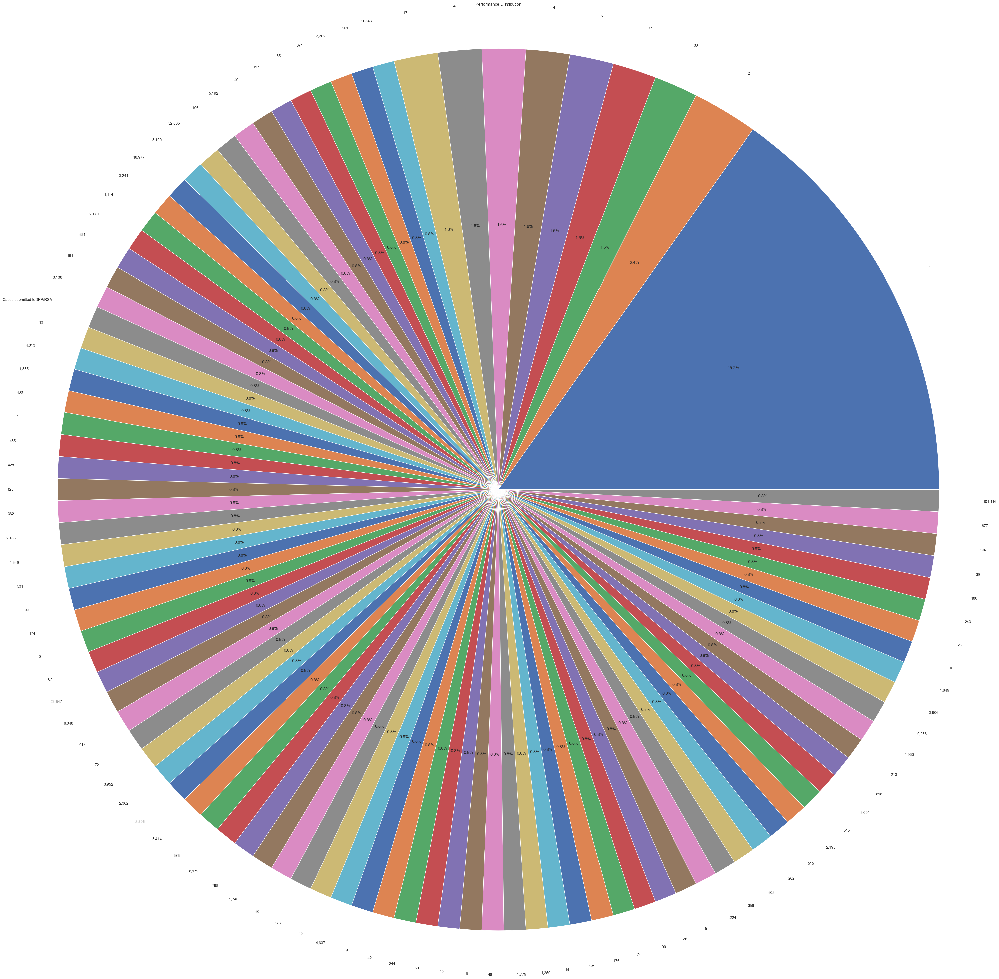

In [9]:
#Since one of the visible  correct column heading was perfomance ,i decided to form a piechart out of it
#In its formating ,i made it big enough since the small figures could conflict and the words couldnt be seen
performance_counts = data1['PERFOMANCE'].value_counts()

# Plot a pie chart
plt.figure(figsize=(50,50))
plt.pie(performance_counts, labels=performance_counts.index, autopct='%1.1f%%')
plt.title('Performance Distribution')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()

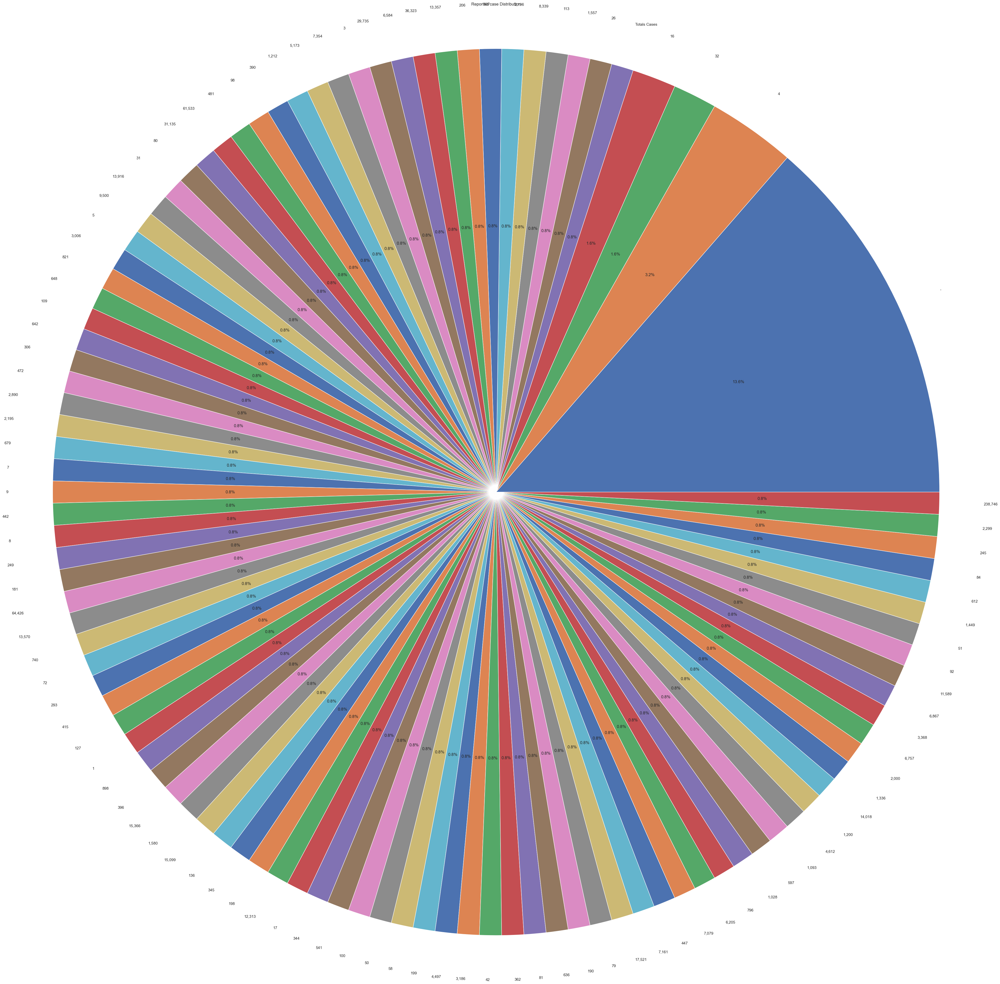

In [10]:
reported_case_counts = data1['REPORTED CASES'].value_counts()

# Plot a pie chart
plt.figure(figsize=(50,50))
plt.pie(reported_case_counts, labels=reported_case_counts.index, autopct='%1.1f%%')
plt.title('Reported case Distribution')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()

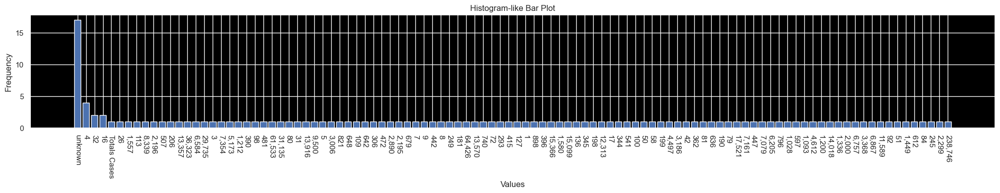

In [57]:

# Calculate the frequency of each unique value in the column
value_counts = data1['REPORTED CASES'].value_counts()

# Set the figure size to increase the width
plt.figure(figsize=(25, 6))

# Plot the histogram-like bar plot
plt.bar(value_counts.index, value_counts.values)

# Add labels and title
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.title('Histogram-like Bar Plot')

# Rotate x-axis labels vertically
plt.xticks(rotation=270, ha='center')

# Increase spacing between x-axis labels
plt.subplots_adjust(bottom=0.5)

# Display the plot
plt.show()




In [ ]:
#started on Mps dataset an named it data2

In [11]:
data2=pd.read_csv('MPsProfileInformation10thParliament.csv',encoding='latin-1')
pd.options.display.max_columns = 50
sns.set(style="darkgrid", rc={"axes.facecolor": "black"})
print(data2)

     No.                              Name of M.P              District  \
0      1                       Aadroa Alex Onzima                  None   
1      2                            Ababiku Jesca              Adjumani   
2      3          ABACANON CHARLES ANGIRO GUTOMOI                  Lira   
3      4                              ABALA DAVID                 Ngora   
4      5                     ABBAS AGABA MUGISHA               Kamwenge   
5      6                 ABIGABA CUTHBERT MIREMBE              Kamwenge   
6      7            Abiriga Ibrahim Yusuf Abdalla                  Arua   
7      8                        Abott Goerge Ouma             NAMAYINGO   
8      9                          Aceng Jane Ruth                  None   
9     10                       Acen Christine Ayo              Alebtong   
10    11                            Achia Remigio         Nakapiripirit   
11    12                       Achia Terence Naco                 Napak   
12    13                 

In [12]:
#checking the shape and how the dataset looks like

data2.columns

Index(['No.', 'Name of M.P', 'District', 'Constituency', 'Political Party',
       'Profession', 'Marital status', 'Phone number', 'Date of Birth',
       'P.L.E School', 'P.L.E Year', 'U.C.E School', 'U.C.E Year',
       'U.A.C.E School', 'U.A.C.E Year', 'First Degree',
       'University of First Degree', 'Year of first Degree', 'Second Degree',
       'University of Second Degree', 'Year of second degree', 'Third Degree',
       'University of Third Degree', 'Year of Third Degree',
       'Other Qualifications', 'Past Job_1', 'Past Job_2', 'Past Job_3',
       'Past Job_4', 'Past Job_5', 'Past Job_6', 'Past Job_7', 'Past Job_8',
       'Past Job_9', 'Past Job_10', 'Hobbies', 'Special Interests',
       'Other Information', 'Professional Body Membership', 'Committee_1',
       'Role on Committee 1', 'Committee_2', 'Role on Committee 2',
       'Committee_3', 'Role on Committee 3', 'Committee_4',
       'Role on Committee 4', 'Unnamed: 47', 'Unnamed: 48', 'Unnamed: 49',
       'Unname

In [13]:
#removing space on the column names for proper column display
data2.columns.str.strip()
print(data2)

     No.                              Name of M.P              District  \
0      1                       Aadroa Alex Onzima                  None   
1      2                            Ababiku Jesca              Adjumani   
2      3          ABACANON CHARLES ANGIRO GUTOMOI                  Lira   
3      4                              ABALA DAVID                 Ngora   
4      5                     ABBAS AGABA MUGISHA               Kamwenge   
5      6                 ABIGABA CUTHBERT MIREMBE              Kamwenge   
6      7            Abiriga Ibrahim Yusuf Abdalla                  Arua   
7      8                        Abott Goerge Ouma             NAMAYINGO   
8      9                          Aceng Jane Ruth                  None   
9     10                       Acen Christine Ayo              Alebtong   
10    11                            Achia Remigio         Nakapiripirit   
11    12                       Achia Terence Naco                 Napak   
12    13                 

In [14]:
print(data2.shape)

(439, 87)


In [15]:
types=data2.dtypes
print(types)

No.                               int64
Name of M.P                      object
District                         object
Constituency                     object
Political Party                  object
Profession                       object
Marital status                   object
Phone number                     object
Date of Birth                    object
P.L.E School                     object
P.L.E Year                       object
U.C.E School                     object
U.C.E Year                       object
U.A.C.E School                   object
U.A.C.E Year                     object
First Degree                     object
University of First Degree       object
Year of first Degree             object
Second Degree                    object
University of Second Degree      object
Year of second degree            object
Third Degree                     object
University of Third Degree       object
Year of Third Degree             object
Other Qualifications             object


In [16]:
#handling only 3 columns (No, constituency,Name of Mp) to check whether there are no nulls,and fill there ,i fill them using fillna()
#Checking whether they all have the correct data according to the datatype specified above

In [17]:
#Handling null first
data2.dropna()
print(data2)


     No.                              Name of M.P              District  \
0      1                       Aadroa Alex Onzima                  None   
1      2                            Ababiku Jesca              Adjumani   
2      3          ABACANON CHARLES ANGIRO GUTOMOI                  Lira   
3      4                              ABALA DAVID                 Ngora   
4      5                     ABBAS AGABA MUGISHA               Kamwenge   
5      6                 ABIGABA CUTHBERT MIREMBE              Kamwenge   
6      7            Abiriga Ibrahim Yusuf Abdalla                  Arua   
7      8                        Abott Goerge Ouma             NAMAYINGO   
8      9                          Aceng Jane Ruth                  None   
9     10                       Acen Christine Ayo              Alebtong   
10    11                            Achia Remigio         Nakapiripirit   
11    12                       Achia Terence Naco                 Napak   
12    13                 

In [35]:
#Having dropped rows with empty values, i used fillna() to fill the NaN values with a string unKnown for proper data identification while visualising
import numpy as np
data2.replace(np.nan, 'not known', inplace=True)
print(data2)

     No.                              Name of M.P              District  \
0      1                       Aadroa Alex Onzima                  None   
1      2                            Ababiku Jesca              Adjumani   
2      3          ABACANON CHARLES ANGIRO GUTOMOI                  Lira   
3      4                              ABALA DAVID                 Ngora   
4      5                     ABBAS AGABA MUGISHA               Kamwenge   
5      6                 ABIGABA CUTHBERT MIREMBE              Kamwenge   
6      7            Abiriga Ibrahim Yusuf Abdalla                  Arua   
7      8                        Abott Goerge Ouma             NAMAYINGO   
8      9                          Aceng Jane Ruth                  None   
9     10                       Acen Christine Ayo              Alebtong   
10    11                            Achia Remigio         Nakapiripirit   
11    12                       Achia Terence Naco                 Napak   
12    13                 

In [19]:
#checking partictular columns whether they have wrong data /invalid data (especially  the columns i want to use for visualisation)
# Perform data validation checks on 'No.'
invalid_No_entries = data2[~data2['No.'].astype(str).str.isdigit()]

# Perform data validation checks on 'Name of M.P'
valid_chars = 'abcdefghijklmnopqrstuvwxyzABCDEFGHIJKLMNOPQRSTUVWXYZ'
invalid_Name_of_MP_entries = data2[data2['Name of M.P'].astype(str).str.contains('[^'+valid_chars+'\s]')]

# Print the invalid entries
if not invalid_No_entries.empty:
    print("Invalid entries in 'No.':")
    print(invalid_No_entries)

if not invalid_Name_of_MP_entries.empty:
    print("Invalid entries in 'Name of M.P':")
    print(invalid_Name_of_MP_entries)



Invalid entries in 'Name of M.P':
     No.                         Name of M.P             District  \
62    63  ASIIMWE EVARLYNE BUREGYEYA (CAPT.)  UPDF REPRESENTATIVE   
91    92            BBUMBA NAMIREMBE M. SYDA             NAKASEKE   
313  314               Nandala-mafabi Nathan              Sironko   
345  346               Ogenga -latigo Morris                Agago   
352  353  Okello P. Engola Charles Macodwogo                 Oyam   
354  355               Okori-moe Grace Akech                 Abim   
365  366                Ongalo-obote Clement          Kaberamaido   

                      Constituency Political Party  \
62             UPDF REPRESENTATIVE            Army   
91           NAKASEKE NORTH COUNTY             NRM   
313           Budadiri County West             FDC   
345             Agago North County             FDC   
352              Oyam County North             NRM   
354  District Woman Representative             NRM   
365                  Kalaki County 

In [ ]:
#checking or duplicates

In [22]:


# Check for duplicates in the dataset
duplicates = data2.duplicated()

# Print the duplicate rows
duplicate_rows = data2[duplicates]
print("Duplicate rows:")
print(duplicate_rows)

# Print the count of duplicates
print("Number of duplicates:", duplicate_rows.shape[0])


Duplicate rows:
Empty DataFrame
Columns: [No., Name of M.P, District, Constituency, Political Party, Profession, Marital status, Phone number, Date of Birth, P.L.E School, P.L.E Year, U.C.E School, U.C.E Year, U.A.C.E School, U.A.C.E Year, First Degree, University of First Degree, Year of first Degree, Second Degree, University of Second Degree, Year of second degree, Third Degree, University of Third Degree, Year of Third Degree, Other Qualifications, Past Job_1, Past Job_2, Past Job_3, Past Job_4, Past Job_5, Past Job_6, Past Job_7, Past Job_8, Past Job_9, Past Job_10, Hobbies, Special Interests, Other Information, Professional Body Membership, Committee_1, Role on Committee 1, Committee_2, Role on Committee 2, Committee_3, Role on Committee 3, Committee_4, Role on Committee 4, Unnamed: 47, Unnamed: 48, Unnamed: 49, Unnamed: 50, Unnamed: 51, Unnamed: 52, Unnamed: 53, Unnamed: 54, Unnamed: 55, Unnamed: 56, Unnamed: 57, Unnamed: 58, Unnamed: 59, Unnamed: 60, Unnamed: 61, Unnamed: 62, U

#visualizing data2 (DATASET FOR MPS)

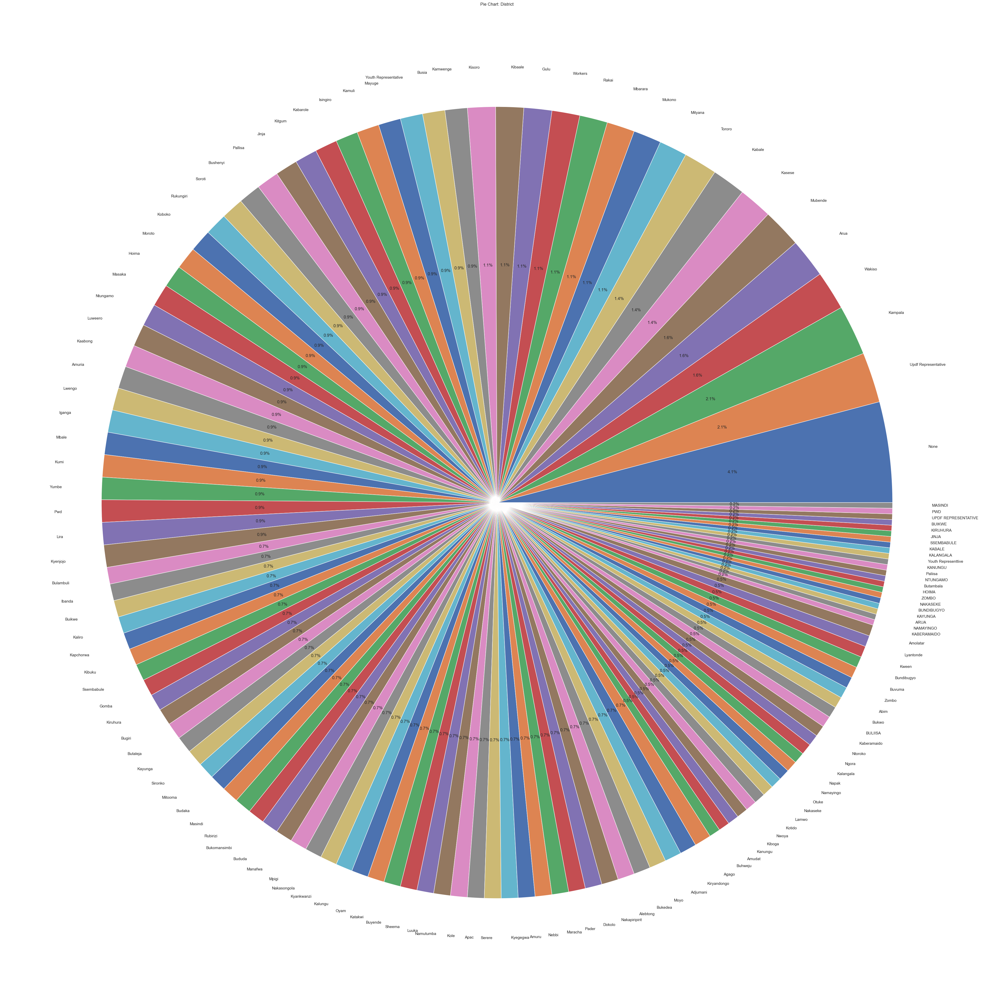

In [20]:
#PIE CHART FOR THE DISTRICTS IN THE COUNTRY
# Count the occurrences of each District
name_counts = data2['District'].value_counts()

# Get the labels and sizes for the pie chart
labels = name_counts.index
sizes = name_counts.values

# Create a pie chart
plt.figure(figsize=(50, 50))
plt.pie(sizes, labels=labels, autopct='%1.1f%%')

# Set the X-axis label (not applicable for pie charts)
plt.xlabel('')

# Set the Y-axis label (not applicable for pie charts)
plt.ylabel('')

# Add a title to the pie chart
plt.title('Pie Chart: District')

# Display the pie chart
plt.show()


In [21]:
#BAR GRAPHS

<AxesSubplot:ylabel='Frequency'>

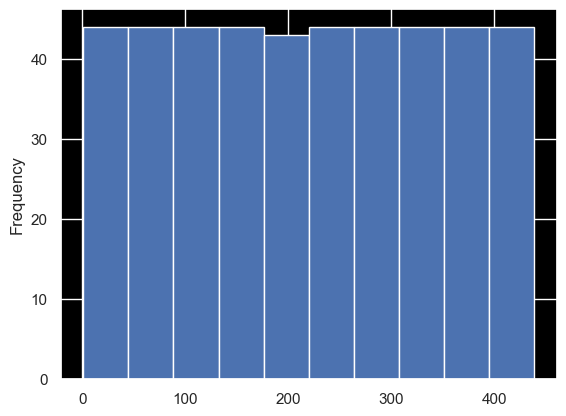

In [46]:
#Number of mp details
data2['No.'].plot(kind='hist')

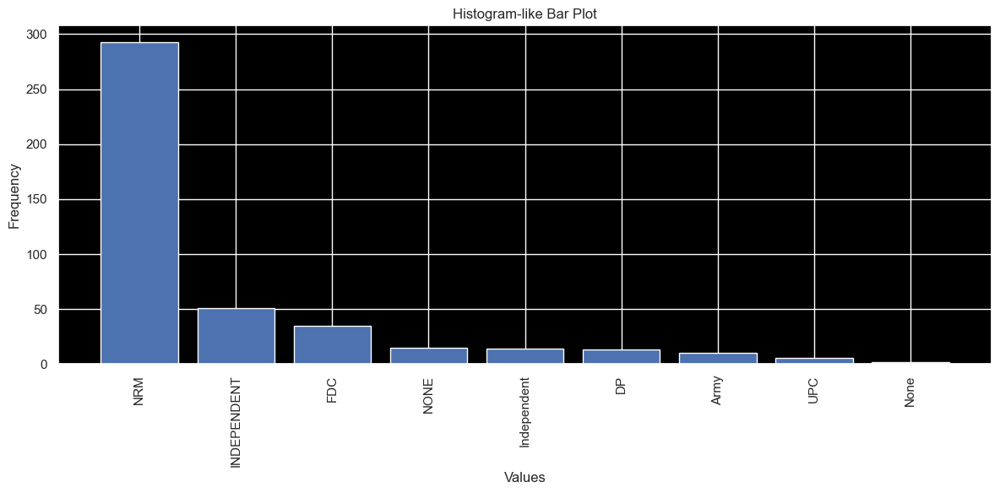

In [50]:

#A bar plot for political parties of the MPS 
# Calculate the frequency of each unique value in the column
value_counts = data2['Political Party'].value_counts()

# Set the figure size to increase the width
plt.figure(figsize=(12, 6))

# Plot the histogram-like bar plot
plt.bar(value_counts.index, value_counts.values)

# Add labels and title
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.title('Histogram-like Bar Plot')

# Rotate x-axis labels vertically
plt.xticks(rotation=90, ha='center')

# Adjust layout to prevent x-axis label cutoff
plt.tight_layout()

# Display the plot
plt.show()


In [29]:
#Here am replacing - with the word unknown regardless of the type of the variable since it looked like a null to me
data1 = data1.replace('-', 'unknown')
print(data1)


    Unnamed: 0                                    Unnamed: 1 REPORTED CASES  \
0          NaN                                           NaN            NaN   
1          NaN                                           NaN   Totals Cases   
2        S/No.                         CASE/CRIME INCIDENCES              1   
3          NaN                                     HOMICIDES            NaN   
4            1                          Death  (by shooting)            190   
5            2                         Death (by mob action)            636   
6            3                             Death (Poisoning)             81   
7            4          Death (Aggravated Domestic Violence)            362   
8            5                        Death(Fire Out Breaks)             42   
9            8             Other Death (Not Specified above)          3,186   
10         NaN                          Sub Total(Homicides)          4,497   
11         NaN                               ECONOMI

In [30]:
print(data2.dropna())


Empty DataFrame
Columns: [No., Name of M.P, District, Constituency, Political Party, Profession, Marital status, Phone number, Date of Birth, P.L.E School, P.L.E Year, U.C.E School, U.C.E Year, U.A.C.E School, U.A.C.E Year, First Degree, University of First Degree, Year of first Degree, Second Degree, University of Second Degree, Year of second degree, Third Degree, University of Third Degree, Year of Third Degree, Other Qualifications, Past Job_1, Past Job_2, Past Job_3, Past Job_4, Past Job_5, Past Job_6, Past Job_7, Past Job_8, Past Job_9, Past Job_10, Hobbies, Special Interests, Other Information, Professional Body Membership, Committee_1, Role on Committee 1, Committee_2, Role on Committee 2, Committee_3, Role on Committee 3, Committee_4, Role on Committee 4, Unnamed: 47, Unnamed: 48, Unnamed: 49, Unnamed: 50, Unnamed: 51, Unnamed: 52, Unnamed: 53, Unnamed: 54, Unnamed: 55, Unnamed: 56, Unnamed: 57, Unnamed: 58, Unnamed: 59, Unnamed: 60, Unnamed: 61, Unnamed: 62, Unnamed: 63, Unna